In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
iou_thresholds = [0.1, 0.3, 0.5]

In [3]:
def iou(gt_interval, generated_interval):
    intersection = max(0, min(gt_interval[1], generated_interval[1]) - max(gt_interval[0], generated_interval[0]))
    union = max(gt_interval[1], generated_interval[1]) - min(gt_interval[0], generated_interval[0])
    return intersection / union if union != 0 else 0

In [4]:
def generate_interval(row):
    return (row['narration_timestamp'] - mapping_df.loc[mapping_df['verb_type'] == row['verb']]['mean_duration'] / 2, row['narration_timestamp'] + mapping_df.loc[mapping_df['verb_type'] == row['verb']]['mean_duration'] / 2)

In [5]:
def timestamp_to_seconds(timestamp):
    return timestamp.dt.hour * 3600 + timestamp.dt.minute * 60 + timestamp.dt.second + timestamp.dt.microsecond / 1e6

In [6]:
# Step 1: Load the train.csv file and extract the narration duration for each verb type
train_df = pd.read_csv('/private/home/arjunrs1/epic-kitchens-100-annotations/EPIC_100_train.csv')

train_df['start_timestamp'] = timestamp_to_seconds(pd.to_datetime(train_df['start_timestamp']))
train_df['stop_timestamp'] = timestamp_to_seconds(pd.to_datetime(train_df['stop_timestamp']))

train_df['duration_seconds'] = train_df['stop_timestamp'] - train_df['start_timestamp']

mean_duration_by_verb_type = train_df.groupby('verb')['duration_seconds'].mean()
std_duration_by_verb_type = train_df.groupby('verb')['duration_seconds'].apply(np.std)

mapping = {'verb_type': list(mean_duration_by_verb_type.index), 'mean_duration': list(mean_duration_by_verb_type.values),
            'std_duration': list(std_duration_by_verb_type.values)}

mapping_df = pd.DataFrame(mapping)
mapping_df.to_csv('/private/home/arjunrs1/epic-kitchens-100-annotations/train_narration_verb_duration.csv', index=False)

validation_df = pd.read_csv('/private/home/arjunrs1/epic-kitchens-100-annotations/EPIC_100_validation.csv')

validation_df['start_timestamp'] = timestamp_to_seconds(pd.to_datetime(validation_df['start_timestamp']))
validation_df['stop_timestamp'] = timestamp_to_seconds(pd.to_datetime(validation_df['stop_timestamp']))
validation_df['narration_timestamp'] = timestamp_to_seconds(pd.to_datetime(validation_df['narration_timestamp']))
validation_df['generated_interval'] = validation_df.apply(lambda row: ((row['narration_timestamp'] - 
                                                                       mapping_df.loc[mapping_df['verb_type'] == 
                                                                        row['verb']]['mean_duration'] / 2), 
                                                                        row['narration_timestamp'] + 
                                                                        mapping_df.loc[mapping_df['verb_type'] == 
                                                                        row['verb']]['mean_duration'] / 2), axis=1)

/tmp/ipykernel_3114606/240892661.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  train_df['start_timestamp'] = timestamp_to_seconds(pd.to_datetime(train_df['start_timestamp']))
/tmp/ipykernel_3114606/240892661.py:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  train_df['stop_timestamp'] = timestamp_to_seconds(pd.to_datetime(train_df['stop_timestamp']))
/tmp/ipykernel_3114606/240892661.py:20: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  validation_df['start_timestamp'] = timestamp_to_seconds(pd.to_datetime(validation_df['start_timestamp']))
/tmp/ipykernel_3114606/24089

In [7]:
results = {}
for threshold in iou_thresholds:
    count_above_threshold = 0
    for index, row in validation_df.iterrows():
        gt_interval = (row['start_timestamp'], row['stop_timestamp'])
        generated_interval = [row['generated_interval'][0].values, row['generated_interval'][1].values]
        iou_score = iou(gt_interval, generated_interval)
        if iou_score > threshold:
            count_above_threshold += 1
    percentage_above_threshold = (count_above_threshold / len(validation_df)) * 100
    results[threshold] = percentage_above_threshold
print("Percentage of narrations with IoU greater than the threshold:")
for threshold, percentage in results.items():
    print(f"Threshold: {threshold}, Percentage: {percentage:.2f}%")

/tmp/ipykernel_3114606/1690372017.py:2: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  intersection = max(0, min(gt_interval[1], generated_interval[1]) - max(gt_interval[0], generated_interval[0]))
/tmp/ipykernel_3114606/1690372017.py:3: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  union = max(gt_interval[1], generated_interval[1]) - min(gt_interval[0], generated_interval[0])


Percentage of narrations with IoU greater than the threshold:
Threshold: 0.1, Percentage: 75.34%
Threshold: 0.3, Percentage: 54.60%
Threshold: 0.5, Percentage: 28.00%


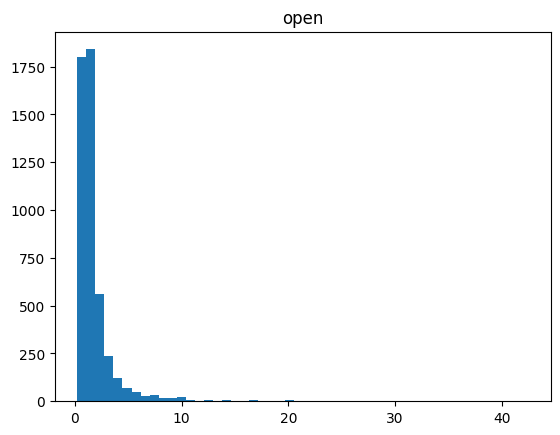

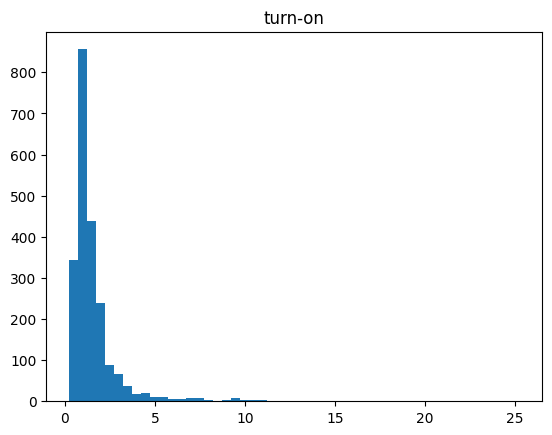

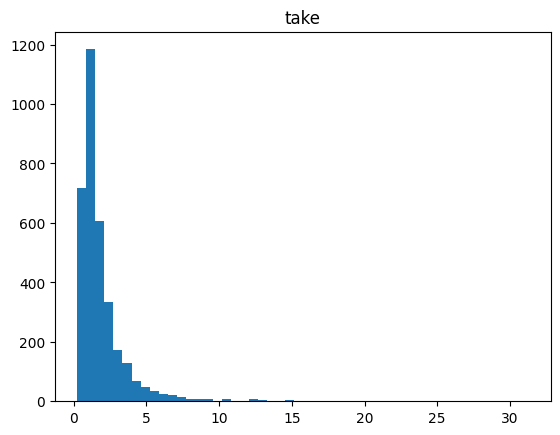

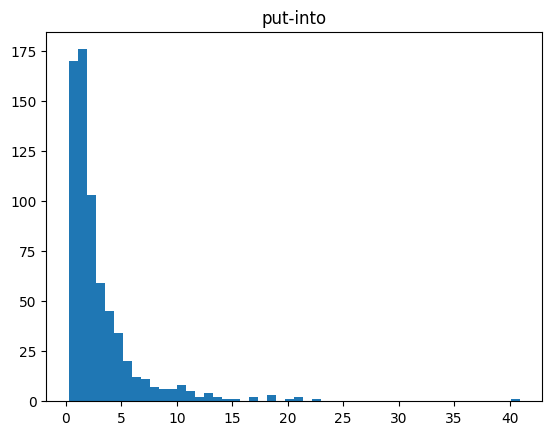

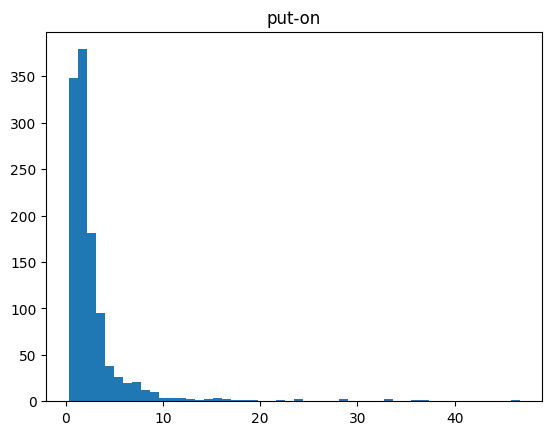

...

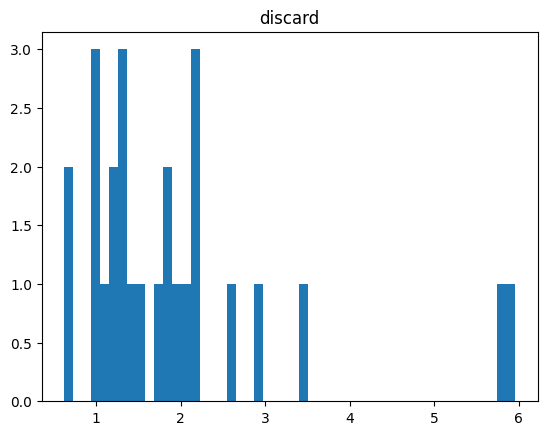

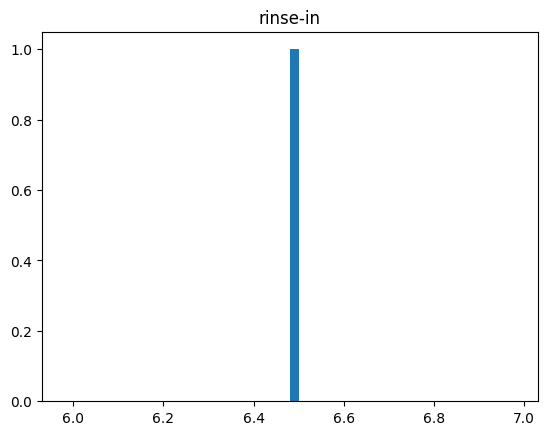

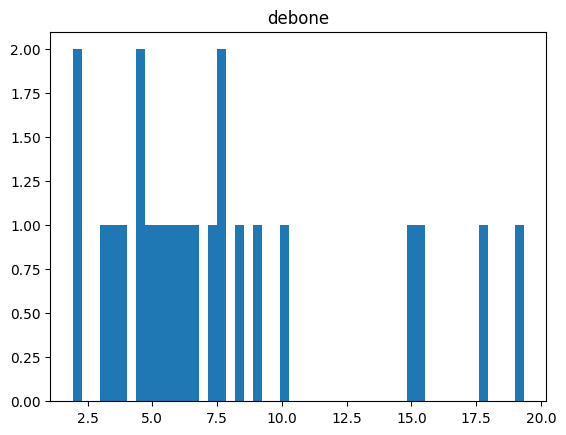

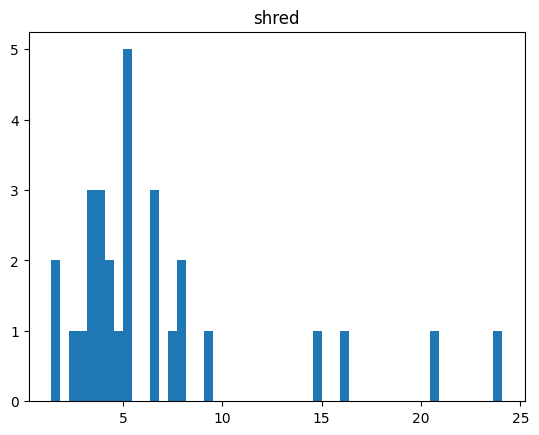

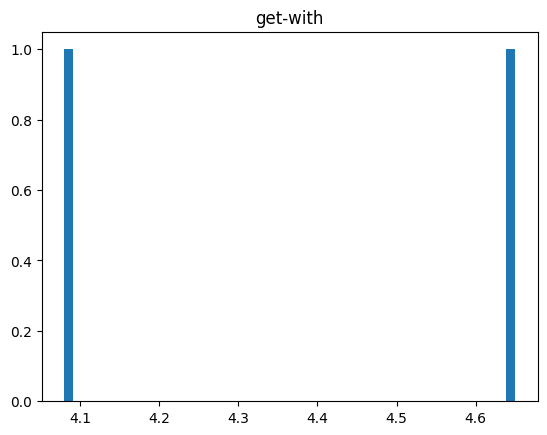

In [20]:
for verb in train_df['verb'].unique():
    plt.hist(train_df[train_df['verb']==verb].duration_seconds, bins=50)
    plt.title(verb)
    plt.show()